# Twitter Users' Sentiments Towards the  Duterte Administration

In this project, we will be analyzing Twitter users' sentiments towards the Duterte Administration through their tweets. The tweets were  collected using the official Twitter API over a course of around 3 weeks. Specifically, the tweets that were collected were tweets that contain the following keywords: `President Rodrigo`, `Digong`, `Duterte`, `pduts`, `duts`, and `du30`.

## Research Questions

The primary aim of the project is to determine what are the sentiments of Twitter users rowards the Duterte administration. With this, the specific questions are as enumerated:
- (Exploratory) What are the words commonly associated with the Duterte Administration?
- (Exploratory) How are twitter users reacting to the government response to the COVID situation in the Philippines?
- (Exploratory) What is the overall perception of twitter users to the Duterte Administration?


## Scope and Limitations

There are a number of limitations that are considered in conducting the study. Primarily, these are based on the data gathering processes that were conducted by the proponents. The tweets were obtained using the Twitter API, which have several restrictions that were followed. Collection of tweets have a 1 week limitation from the current day. Moreover, the project registered for the API only has a maximum of 500,000 that can be gathered. With these restrictions, the proponents peformed data collection starting from May 4, 2021 to May 25, 2021. This implies that all of the tweets that will be used in the study are posted by users from April 27, 2021 to May 25, 2021 and are public. The tweets collected and the processes applied mainly focused on the English language. However, a lot of which still contained words from other languages, such as Filipino. With this, though they are included in the text, they do not have implications towards the sentiment analysis procedures conducted in the project.

In addition, given that the keywords used in data collection were only self-defined, there may be tweets about the administration that were missed and therefore not included in the study.

Moreover, it is important to note that these tweets are only representative of Twitter users whose accounts are public. Another thing to note is that the labels used in this notebook (positive, negative, and neutral) are representative of the entire tweet, not President Duterte himself, as mentioning the president in a tweet does not necessarily mean that the subject of the tweet is him.

Lastly, the results of this analysis are limited by the current technologies and models used; most Filipino words were removed from the tweets and thus the results of project may not be completely accurate.

---

First, let's import all the packages and libraries we need for this project.

In [1]:
import pandas as pd
import json
import re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import nltk
import string
from nltk.corpus import stopwords # get stopwords from NLTK library
from nltk.tokenize import word_tokenize # to create word tokens
from nltk.stem.porter import * # (I played around with Stemmer and decided to use Lemmatizer instead)
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import SnowballStemmer
from emot.emo_unicode import UNICODE_EMO, EMOTICONS
from nltk.stem import WordNetLemmatizer # to reduce words to orginal form
from nltk import pos_tag # For Parts of Speech tagging
from nltk.corpus import words # Get all words in english language
from PIL import Image # for opening, manipulating, and saving many different image file f
from wordcloud import WordCloud # WordCloud - Python linrary for creating image wordclouds
import random # generating random numbers
import textblob
from textblob import TextBlob 
import string
import math

#Visualization tools
import plotly.express as px # To make express plots in Plotly
import chart_studio.tools as cst # For exporting to Chart studio
import chart_studio.plotly as py # for exporting Plotly visualizations to Chart Studio
import plotly.io as pio # Plotly renderer
import plotly.graph_objects as go # For plotting plotly graph objects
from plotly.subplots import make_subplots

---

## Merging of Json Files

The data, stored in JSON files, are located inside the folder `ALL_DATA`. We iterate through all the files and merge the data into one DataFrame, `tweets_df`.

In [2]:
tweets_df = pd.DataFrame()

for filename in os.listdir(path='ALL_DATA'):
    # print(filename)
    dirFileName = "ALL_DATA/"+filename
    newData = pd.read_json(dirFileName, orient='records', lines='true')
    tweets_df = tweets_df.append(newData, ignore_index=True)

---

## Initial Dataset Exploration

Let's first see what out current dataset looks like.

In [3]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25272 entries, 0 to 25271
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   tweet_id        25272 non-null  int64         
 1   user_username   25272 non-null  object        
 2   text            25272 non-null  object        
 3   favorite_count  25272 non-null  int64         
 4   retweet_count   25272 non-null  int64         
 5   created_at      25272 non-null  datetime64[ns]
 6   location        25272 non-null  object        
 7   hashtags        562 non-null    object        
dtypes: datetime64[ns](1), int64(3), object(4)
memory usage: 1.5+ MB


Looking at the code block above, we can see that the dataset contains 8 columns and 25,272 rows. Each observation corresponds to a single tweet and its details as seen below.

| column | description |
|---|---|
| `tweet_id` | identifier for the tweet |
| `user_username` | the author of the tweet |
| `text` | the tweet body |
| `favorite_count` | the number of favorites of the tweet |
| `retweet_count` | the number of retweets of the tweet|
| `created_at` | the time at which the tweet was posted |
| `location` | the location embedded in the tweet, which may be user defined |
| `hashtags` | the hashtags identified in the tweet |

We can also check the details of the categorical values by calling `describe()`.

In [4]:
tweets_df.describe()

,tweet_id,favorite_count,retweet_count
count,2.527200e+04,25272.000000,25272.000000
mean,1.393261e+18,19.370687,5.056664
std,2.513785e+15,209.108630,79.169081
min,1.386705e+18,0.000000,0.000000
25%,1.391027e+18,0.000000,0.000000
50%,1.394109e+18,1.000000,0.000000
75%,1.395141e+18,5.000000,1.000000
max,1.397120e+18,12151.000000,6014.000000


We can see that the average favorite count is around 19, while the average retweet count is 5. However, that may be incorrect as the dataset contains many duplicates.

With that, we proceed to data cleaning.

---

## Data Cleaning

#### Remove irrelevant columns

First, we drop the column `user_username` for 2 reasons: firstly, it is not relevant to the study, and secondly, to protect the privacy of Twitter users. In addition to `user_username`, we decided not to use the `location` column as well, as it is also not relevant to the study. More importantly, some values under the `location` column are user-defined and thus not reflect the actual location of the Twitter user.

Thus, we will remove these columns by using the `drop()` function. We pass the column names to that function and set `inplace` to `True` so it will update the original DataFrame.

In [5]:
tweets_df.drop(columns=['user_username', 'location'], inplace=True)
tweets_df.columns

Index(['tweet_id', 'text', 'favorite_count', 'retweet_count', 'created_at',
       'hashtags'],
      dtype='object')

#### Drop duplicate tweet ids

As mentioned earlier, we currently have 8 features and 25,272 tweets, many of which are duplicates (based on their tweet_id). We can check which tweets are duplicates and which are not by calling `duplicated()` together with `value_couns()`.

In [6]:
tweets_df.duplicated('tweet_id').value_counts()

False    14133
True     11139
dtype: int64

We can drop them easily using the `drop_duplicates()` function, specifying to drop rows according to duplicate values in `tweet_id`. We're now left with 14,133 tweets unique tweets.

In [7]:
tweets_df = tweets_df.drop_duplicates(subset=['tweet_id']) #drop duplicate values
tweets_df.shape

(14133, 6)

#### Removing tweets with "Olivia"

We've already considered cases wherein Twitter users use "Rodrigo" to refer to Olivia Rodrigo, the artist, instead of Rodrigo Durterte. To address that, instead of including `Rodrigo` in our keywords, we included `President Rodrigo` instead. However, Olivia is still mentioned in other tweets, as seen below:

In [8]:
tweets_df[tweets_df['text'].apply(lambda tweet: 'olivia' in tweet.lower())][['text']].style

,text
113,yes i am a supporter of president rodrigo olivia
114,In my opinion Olivia Rodrigo is the president
116,"@travisdurag @nickiyuhna @augusttrying @markashley35 @MotiveAriola @chartdata @Olivia_Rodrigo olivia only, not rodrigo. he's the worst president ever"
127,"@zoloftzlut president of the taylor swift fan club, olivia rodrigo"
145,OLIVIA RODRIGO PRESIDENT OF THE PHILIPPINES https://t.co/HwyrKT1UTE
391,@Olivia_Rodrigo the future president
630,who else do you know that played snl within four months of the beginning of her career!!!!! olivia rodrigo should be president
700,okay good for u... I’m NOW on the olivia rodrigo stan train. for all intents and purposes SHE is my president of the Philippines
760,"#Uganda: President Yoweri Museveni has promised to give full support to Ugandans to help tackle poverty. He urged citizens to get involved in any of the four economic sectors (Agriculture with cura, Industries, Services, and ICT). #NewsCentralTV #AfricaFirst / olivia rodrigo / https://t.co/bfCUaCRrkH"
1549,@croatianbarbs -doja cat -olivia Rodrigo -a new U.S. president -a capital storming -highest unemployment rate ever -nicki 2 #1s


Here is an example tweet, which we will use later on to check if it has been removed from the dataset.

In [9]:
tweets_df.loc[[391]][['text']].style

,text
391,@Olivia_Rodrigo the future president


However, we've also noticed that there are also tweets wherein both Olivia and Duterte are both mentioned, which are still relevant to this project, as seen below.

In [10]:
tweets_df[tweets_df['text'].apply(lambda tweet: 'olivia' in tweet.lower() and 'duterte' in tweet.lower())][['text']].style

,text
2850,"Literally knew abt our president, Olivia Rodrigo Duterte, because of the tiktok gays with drivers license on repeat 😭 https://t.co/ywqzhGdj8j"
4709,that's not olivia rodrigo that's olivia rodrigo duterte https://t.co/d0Kgs8CF1N
4829,"@kee_zhah I cant relate to this issue cus when people think of filipino men they think of moreno skin, pacquiao, Jose rizal, Athletic, talented daddys... what attracts us are woman that are just like us, talented like Olivia rodrigo, sarah geronimo or strong woman like Sarah Duterte 🥵"
4830,this is an Olivia Rodrigo Duterte stan account https://t.co/EEGEzLX6Fy
4860,my olivia rodrigo duterte bobby brown hater era is ending today! https://t.co/noUAE98mgM
4985,@ErnabelD @RodAPulido Sarah duterte & Olivia rodrigo might be the only filipina heroes
5601,I love Olivia Rodrigo but she reminds me of Rodrigo Duterte and so every time I listen to her I can’t help but imagine nga si Kitty Duterte ang ga kanta ????
5647,hope ur ok - olivia rodrigo duterte charot 🤪 apparently its a gay song??? so i sang it obviously 😌✨💅🏽 https://t.co/NDd1S85Suj
5678,good 4 u is such a good song i haven't even heard the full album yet but i shall root for my pinay queen olivia rodrigo duterte https://t.co/NFaJOyOPY9
5693,so true Olivia Rodrigo duterte suck bcs of it now https://t.co/0vTvShwMJt


Hence, just to be safe, we only drop tweets wherein Olivia is mentioned and Duterte is not.

In [11]:
index_names = tweets_df[tweets_df['text'].apply(lambda tweet: "olivia" in tweet.lower() and "duterte" not in tweet.lower())].index
tweets_df.drop(index_names, inplace=True)

Let's try to check if the sample tweet mentioned earlier is still there.

In [12]:
391 in tweets_df.index

False

---

## Feature Engineering

#### Change UTC to UTC+8

Next, we transform the default timezone returned by the Twitter API to the local timezone, UTC+8. We first import relevant libraries.

In [13]:
from datetime import datetime
from dateutil import tz

from_zone = tz.gettz('UTC')
to_zone = tz.gettz()

In [14]:
tweets_df['created_at'].head(3)

0   2021-05-20 14:30:01
1   2021-05-20 14:30:00
2   2021-05-20 13:58:28
Name: created_at, dtype: datetime64[ns]

We can convert the timezone by using `tz_localize()` and `tz_convert` to Hongkong, which is in the same timezone as the Philippines.

In [15]:
tweets_df['created_at'] = tweets_df['created_at'].dt.tz_localize('UTC').dt.tz_convert('Hongkong')

As we can see, 8 hours has been added to the `created_at` column of the first observation.

In [16]:
tweets_df['created_at'].head(3)

0   2021-05-20 22:30:01+08:00
1   2021-05-20 22:30:00+08:00
2   2021-05-20 21:58:28+08:00
Name: created_at, dtype: datetime64[ns, Hongkong]

---

## Initial Exploratory Data Analysis

#### Getting the most popular hashtags

Although there is already a `hashtags` column, its values are inaccurate.  For example, in the tweet below, `hashtags` should contain `Duterte`, `Pfizer`, and `Indigent`, but it's empty.

In [17]:
tweets_df[['text', 'hashtags']].head(1).style

,text,hashtags
0,Presidential Spokesperson Harry Roque Jr. said Indigent Filipinos will soon be prioritized for the Pfizer vaccine following an order by President Rodrigo Roa Duterte. This is in line with conditions set by the COVAX Facility. #Duterte #Pfizer #Indigent https://t.co/tXSmLub2sU,nan


Thus, we define our own function, `extract_hashtags`.

In [18]:
def extract_hashtags(tweet):
    return list(part[1:] for part in tweet.split() if part.startswith('#'))

We apply this to the column `text` using `map()`.

In [19]:
tweets_hashtags = tweets_df['text'].map(extract_hashtags)
tweets_hashtags

0          [Duterte, Pfizer, Indigent]
1          [Duterte, Pfizer, Indigent]
2                                   []
3                                   []
4                                   []
                     ...              
25063                               []
25064    [PSETODAY, PSEI, Philippines]
25065                               []
25066                               []
25067                               []
Name: text, Length: 14088, dtype: object

As we can see, we have successfully extracted the hashtags for the example tweet earlier.

In [20]:
tweets_hashtags = [x for x in tweets_hashtags if x]
tweets_hashtags[1]

['Duterte', 'Pfizer', 'Indigent']

We place all of the hashtags in a single list.

In [21]:
flat_list = []
for sublist in tweets_hashtags:
    for item in sublist:
        flat_list.append(item)

tweets_hashtags = np.array(flat_list)
tweets_hashtags[0:5]

array(['Duterte', 'Pfizer', 'Indigent', 'Duterte', 'Pfizer'],
      dtype='<U108')

We store the hashtags extracted in a new DataFrame, `tweets_hashtags_df`...

In [22]:
tweets_hashtags_df = pd.DataFrame(tweets_hashtags, columns = ['hashtag'])

...and then get the frequency of the hashtags and keep the top 10 hashtags and their frequencies, as seen below:

In [23]:
tweets_hashtags_df = tweets_hashtags_df["hashtag"].value_counts().rename_axis('Hashtag').reset_index(name='counts')
top_hashtags = tweets_hashtags_df.nlargest(10, 'counts')
print(top_hashtags)

          Hashtag  counts
0         Duterte     295
1  DuterteTraydor     166
2   DutertePalpak     138
3    PolitikoNews     135
4     Philippines     120
5          ICYMI:      94
6    DuterteDuwag      88
7   DuterteResign      81
8         COVID19      79
9   DuterteInutil      66


In [24]:
top_hashtags

,Hashtag,counts
0,Duterte,295
1,DuterteTraydor,166
2,DutertePalpak,138
3,PolitikoNews,135
4,Philippines,120
5,ICYMI:,94
6,DuterteDuwag,88
7,DuterteResign,81
8,COVID19,79
9,DuterteInutil,66


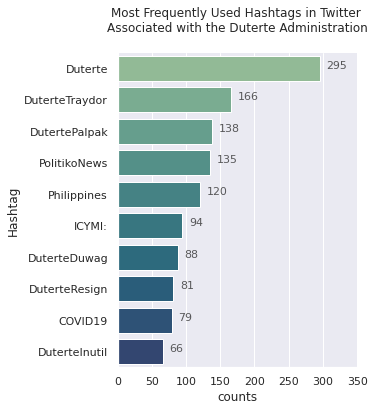

In [25]:
sns.set(rc={'figure.figsize':(12, 8)})

top_hashtags_plot = sns.catplot(y="Hashtag", x="counts", orient="h", kind="bar", data=top_hashtags, palette ="crest")
top_hashtags_plot.set(title='Most Frequently Used Hashtags in Twitter \nAssociated with the Duterte Administration\n', xlim=(0, 350))

for index in range(0, len(top_hashtags)):
    plt.text(top_hashtags.iloc[index][1] + 10, index, top_hashtags.iloc[index][1], alpha=0.75, fontsize=11)

Looking at the visualization above, we can see that most hashtags within the top 10 category are either neutral, such as `#Duterte`, `#PolitikoNews`, `#Philippines`, `#ICYMI` (In Case You Missed It), and `#COVID19`, or anti-Duterte, such as `#DuterteTraydor`, `#DutertePalpak`, `#DuterteDuwag`, `#DuterteResign`, and `#DuterteInutil`.

#### Top favorited/retweeted tweets

##### Favorites
To view the top 5 favorited tweets, we call `nlargest()` for column `favorite_count`.

In [26]:
top_favorites = tweets_df[['text','favorite_count']]
top_favorites = top_favorites.nlargest(5, 'favorite_count')
top_favorites.style

,text,favorite_count
13035,It’s May. Duterte’s final year as president. Nice.,12151
1421,"CHALLENGE ACCEPTED. Retired Supreme Court Senior Associate Justice Antonio Carpio refuses to back down and ""gladly accepts"" President Rodrigo Duterte's dare to a debate on the West Philippine Sea issue. https://t.co/xfXy53xEdL",8561
6946,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime.",7884
1305,"Challenge made. Challenge accepted. And now, we have a host. The Philippine Bar Association now volunteers to host the debate between President Rodrigo Duterte and Retired Supreme Court Justice Antonio Carpio about the West Philippine Sea. @ABSCBNNews https://t.co/fwBj8MwTGi",6190
1339,JUST IN: The Philippine Bar Association offers to host debate between President Rodrigo Duterte and ret. SC SAJ Antonio Carpio on the West Philippine Sea. | via @mikenavallo https://t.co/eIvexyPlHO,5493


The tweets are lengthy and may be difficult to fit in the visualization later on, so we first shorten the tweets by inserting a new line after around every 70 characters.

In [27]:
def split(string):
    string = string.replace('\n',' ')
    words = string.split(' ')
    index = 0
    new_string = ''
    for word in words:
        index += len(word)
        if index > 70:
            word += '\n'
            index = 0
        else:
            word += ' '
        
        new_string += word
    return new_string

In [28]:
top_favorites['text'] = top_favorites['text'].apply(split)

We then append an ellipsis at the end of each string if it's longer than 100 characters.

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)


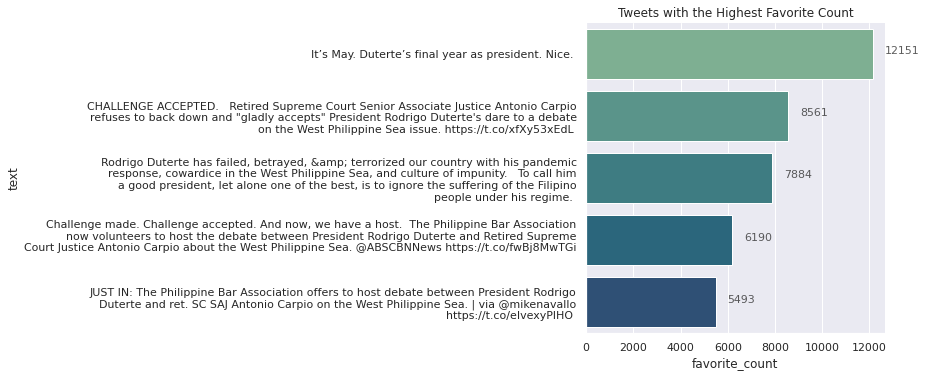

In [29]:
setcat = sns.catplot(y="text", x="favorite_count", orient="h", kind="bar",data=top_favorites, palette ="crest")
setcat.set(xlim=(0, top_favorites.iloc[0][1] + 500))
setcat.set(title='Tweets with the Highest Favorite Count')


for index in range(0, 5):
    plt.text(top_favorites.iloc[index][1] + 500, index, top_favorites.iloc[index][1], alpha=0.75, fontsize=11)

As seen from the results, we can see that most of the top-favorited tweets are leaning towards anti-Duterte, especially the 3rd tweet. Other tweets also mention the supposed debate between Retired Supreme Court Senior Associate Justice Antonio Carpio and President Rodrigo Duterte, to which the latter eventually backed down to.

##### Retweets

Following this, we can check the top retweeted tweets as well by replicating what we did for the top favorited tweets.

In [30]:
top_retweets = tweets_df[['text','retweet_count']]
top_retweets = top_retweets.nlargest(5, 'retweet_count')

top_retweets.style

,text,retweet_count
11700,"articles on the blatant sexism, homophobia, and murder committed by the philippine president, rodrigo duterte. ; a thread",5930
7389,"LOOK: Retired Senior Associate Justice Antonio Carpio responds to President Rodrigo Duterte's recent statement on the West Philippine Sea. Duterte asked Carpio and ex-DFA Secretary Albert Del Rosario: If you’re bright, why did we lose the West Philippine Sea? | @TristanNodalo https://t.co/ePhnLQv3Ot",2317
6946,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime.",1936
7420,"Apart from Covid-19, Philippines could face food crisis in the very near future because 240,000 KILOS of FISH are ILLEGALLY taken away DAILY by Chinese fishing vessels. Save the Nation! #DuterteResign #DuterteTraydor #DutertePalpak Sign the Petition! https://t.co/rv5raUJvfG https://t.co/hNdd726bTE https://t.co/PeZ3UrX7TJ",1732
11590,'JOKE-JOKE LANG' The fisherman who asked President Rodrigo Duterte during the 2016 presidential debates about his actions to help fishermen in the West Philippine Sea said the President has become a joke too. https://t.co/j5UV6cAJk4 https://t.co/4uro3jJQr2,1403


In [31]:
top_retweets['text'] = top_retweets['text'].apply(split)

Similarly, we can visualize the results using a bar graph.

/shared-libs/python3.7/py/lib/python3.7/site-packages/seaborn/axisgrid.py:64: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  self.fig.tight_layout(*args, **kwargs)


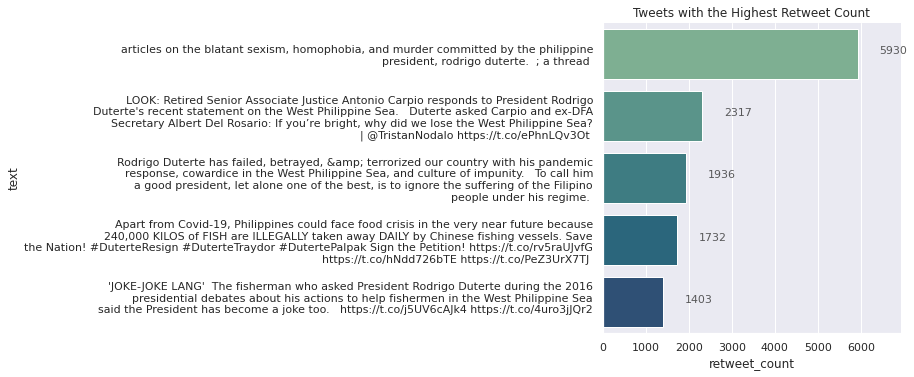

In [32]:
setcat = sns.catplot(y="text", x="retweet_count", orient="h", kind="bar",data=top_retweets, palette ="crest")
setcat.set(xlim=(0, top_retweets.iloc[0][1] + 1000))
setcat.set(title='Tweets with the Highest Retweet Count')

for index in range(0, 5):
    plt.text(top_retweets.iloc[index][1] + 500, index, top_retweets.iloc[index][1], alpha=0.75, fontsize=11)

As seen from the results, most of the top-favorited tweets are also against Presient Duterte, mentioning the issue regarding West Philippine Sea as well as the debate with Carpio, and most notably, a thread detailing President Duterte's actions which many consider offensive.

#### Time with most tweets

We also wanted to find out what hour do Twitter users tweet the most about Duterte. We first check the `created_at` column.

In [33]:
tweets_df['created_at'].head(5)

0   2021-05-20 22:30:01+08:00
1   2021-05-20 22:30:00+08:00
2   2021-05-20 21:58:28+08:00
3   2021-05-20 21:45:55+08:00
4   2021-05-20 21:36:16+08:00
Name: created_at, dtype: datetime64[ns, Hongkong]

Since it's already in datetime format, we can easily access the hour with `dt.hour`.

In [34]:
tweets_df['created_hour'] = tweets_df['created_at'].dt.hour
tweets_df['created_hour'].head(5)

0    22
1    22
2    21
3    21
4    21
Name: created_hour, dtype: int64

We first create a DataFrame containing the hours of the day and the frequency of tweets created at each hour.

In [35]:
most_tweets_hour = tweets_df["created_hour"].value_counts().rename_axis('hour_created').reset_index(name='counts')
most_tweets_hour.style

,hour_created,counts
0,12,932
1,15,845
2,18,843
3,20,833
4,14,815
5,21,797
6,16,787
7,17,785
8,19,774
9,13,770


Following this, we sort it by the hour.

In [36]:
# sort hours
most_tweets_hour.sort_values(by=['hour_created'], inplace=True)
most_tweets_hour.style

,hour_created,counts
17,0,344
19,1,263
21,2,204
23,3,174
22,4,183
20,5,216
18,6,315
16,7,360
15,8,536
12,9,648


And lastly, we can visualize the trend using a line graph.

[Text(0.5, 1.0, 'Time Series Plot on When Users Tweet about President Duterte')]

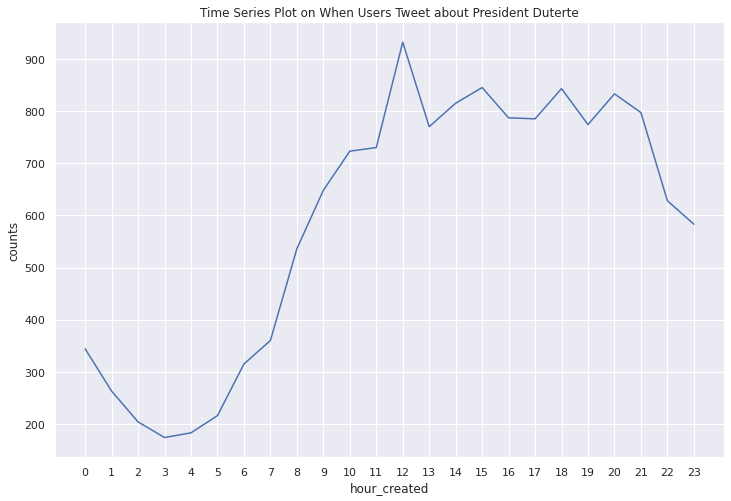

In [37]:
most_tweets_hour_plot = sns.lineplot(data = most_tweets_hour, x = "hour_created", y = "counts", palette ="crest")
most_tweets_hour_plot.set_xticks(range(0,24))
most_tweets_hour_plot.set(title='Time Series Plot on When Users Tweet about President Duterte')

Looking at the graph, we can see that most tweets, as expected, are usually created from morning to evening.

---

## Data Preparation

We must first prepare and pre-process the data so it can be easily processed later on. Specifically, we will go through the following steps:
* Converting to lowercase
* Extracting emojis
* Extracting hashtags
* Removing stop words
* Removing URLs
* Removing user references
* Removing possessives
* Removing contractions
* Lemmatization
* Removing punctuations

### Extracting Emojis

Tweets often contain a lot of noise, including emojis. They may be useful later in analyzing which emojis are usually used when Twitter users mention Duterte; however, we will remove them from the actual tweet in order to clean the text data.

Following this is an example tweet with an emoji. This will be used later on to verify if the emojis have actually been removed.

In [38]:
tweets_df.loc[10153, 'text']

'hellooo besties i have covid so ill be a little ia til the symptoms ease 😭😭😭 pls wear ur masks !! and dont forget na tangina ni du30 💗'

In order to process the emojis, we will use `demoji`.

In [39]:
import demoji
# uncomment if needed
# demoji.download_codes()

We then create a new column, `emoji`, containing the emojis in a single tweet. Following this, we remove them from the actual tweet and then move the new text to a new column, `processed_tweets`.

In [40]:
tweets_df["emoji"] = tweets_df["text"].apply(lambda tweet: demoji.findall_list(tweet, False))
tweets_df["processed_text"] = tweets_df["text"].apply(lambda tweet: demoji.replace(tweet, " "))

In [41]:
tweets_df.loc[[10153]][['emoji']].style

,emoji
10153,"['😭', '😭', '😭', '💗']"


As we can see from above, the sample tweet earlier now has a new column containing the 4 emojis used in the tweet.

In [42]:
tweets_df.loc[[10153]][['processed_text']].style

,processed_text
10153,hellooo besties i have covid so ill be a little ia til the symptoms ease pls wear ur masks !! and dont forget na tangina ni du30


In addition to that, the `processed_text` column now contains a copy of the tweet excluding the emojis.

### Extracting Hashtags

We now used the function defined earlier, `extract_hashtags`, to remove the hashtags and place them in another column.

In [43]:
tweets_df["hashtags"] = tweets_df["text"].map(extract_hashtags)
tweets_df["hashtags"]

0          [Duterte, Pfizer, Indigent]
1          [Duterte, Pfizer, Indigent]
2                                   []
3                                   []
4                                   []
                     ...              
25063                               []
25064    [PSETODAY, PSEI, Philippines]
25065                               []
25066                               []
25067                               []
Name: hashtags, Length: 14088, dtype: object

### Tweets Preprocessing

We define all NLTK stop words, user-defined stop words, alphabets, etc.

In [44]:
# Uncomment if needed
# nltk.download('stopwords')
# nltk.download('punkt')
# nltk.download('wordnet')
# nltk.download('averaged_perceptron_tagger')
# nltk.download('vader_lexicon')

We also include Filipino stopwords, taken from this repository: https://github.com/stopwords-iso/stopwords-tl/blob/master/raw/genediazjr-tagalog.txt


In [45]:
fil_stopwords = ['ako', 'sa', 'akin', 'mo', 'ko', 'aking', 'sarili', 'kami', 'atin', 'lang', 'ang', 'aming', 'amin', 'ating', 'ka', 'iyong', 'iyo', 'inyong', 'siya', 'kanya', 'mismo', 'ito', 'nito', 'kanyang', 'sila', 'nila', 'kanila', 'kanilang', 'kung', 'ano', 'alin', 'sino', 'kanino', 'na', 'mga', 'iyon', 'am', 'ay', 'maging', 'naging', 'mayroon', 'may', 'nagkaroon', 'pagkakaroon', 'gumawa', 'ginagawa', 'ginawa', 'paggawa', 'ibig', 'dapat', 'maaari', 'marapat', 'kong', 'ikaw', 'tayo', 'hindi', 'namin', 'gusto', 'nais', 'niyang', 'nilang', 'niya', 'huwag', 'ginawang', 'gagawin', 'maaaring', 'sabihin', 'narito', 'kapag', 'ni', 'nasaan', 'bakit', 'paano', 'kailangan', 'walang', 'katiyakan', 'isang', 'at', 'pero', 'o', 'dahil', 'bilang', 'hanggang', 'habang', 'ng', 'pamamagitan', 'para', 'tungkol', 'laban', 'pagitan', 'panahon', 'bago', 'pagkatapos', 'itaas', 'ibaba', 'mula', 'pataas', 'pababa', 'palabas', 'ibabaw', 'ilalim', 'muli', 'pa', 'minsan', 'dito', 'doon', 'saan', 'lahat', 'anumang', 'kapwa', 'bawat', 'ilan', 'karamihan', 'iba', 'tulad', 'lamang', 'pareho', 'kaya', 'kaysa', 'masyado', 'napaka', 'isa', 'bababa', 'kulang', 'marami', 'ngayon', 'kailanman', 'sabi', 'nabanggit', 'din', 'kumuha', 'pumunta', 'pumupunta', 'ilagay', 'makita', 'nakita', 'katulad', 'mahusay', 'likod', 'kahit', 'paraan', 'noon', 'gayunman', 'dalawa', 'tatlo', 'apat', 'lima', 'una', 'pangalawa']

The following cell defines the expanded forms of contractions.

In [46]:
contractions_dict = {     
    "ain't": "am not",
    "aren't": "are not",
    "can't": "cannot",
    "can't've": "cannot have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he had",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "I'd": "I had",
    "I'd've": "I would have",
    "I'll": "I will",
    "I'll've": "I will have",
    "I'm": "I am",
    "I've": "I have",
    "isn't": "is not",
    "it'd": "it had",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "iit will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she had",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so is",
    "that'd": "that had",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there had",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they had",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we had",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you had",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
}

In [47]:
# Defining my NLTK stop words and my user-defined stop words
stop_words = list(stopwords.words('english'))

# The list below are common words which will not be relevant in our analysis.
# common_words = [
#   "duterte", "dutertes","president","rodrigo",'’',"'s",'philippine',"du","sea","''","said",'``',"people","say",'"',"vaccine","west",'”',"n't","country","via","filipino","like","may","government","one","amp","roque","issue","read","na","would",'u',"year","enrile","administration","wps"
# ]

common_words = ['ha','wa','pduts', 'xi', 'dd', 'mo','‘','duts',  '..', 'ng', 'r.', 'ni', 'dd', '\'', 'si', 'digong','”','“','\'\'','’', '``', 'covid-', 'u', 'u ', ' u','duterte', 'dutertes', '...','president','rodrigo','philippine', 'philippines','du','said','people','say','vaccine','west','country','via','filipino','like','may','government','one','amp','issue','read','na','would','u','year,','administration','wps']
common_words2 = ["national","time","still","also","ang","know","pres","roa","want","statement","sa","presidential","sign","law","south","talk","address","ph","call","senator","malacañang","another","look","take","debate","let","water","first","see","day","really"]
common_words.append(common_words2)

alphabets = list(string.ascii_lowercase)
stop_words = stop_words + alphabets + common_words + common_words2 + fil_stopwords
emojis = list(UNICODE_EMO.keys())
snowball_stemmer = SnowballStemmer('english')
#word_list = words.words()  # all words in English language

We now define a function, `preprocessTweets` in order to process the tweets. This function includes multiple steps, such as changing all the letters to lowercase, removing user mentions, hashtags, links, possessives, contractions, as well as lemmatizing the words in the tweet. Lastly, we remove the stopwords as well as punctuatons.

In [48]:
# Preprocessing Methods
# Function to remove stop words, punctuations, emojis and return words to their base form using Lemmatizer
def preprocessTweets(tweet):
    tweet = tweet.lower()  # changes all words to lower case
    # Remove urls
    tweet = re.sub(r"http\S+|www\S+|https\S+", '', tweet, flags = re.MULTILINE)

    # Remove user @ references and '#' from tweet
    tweet = re.sub(r'\@\w+|\#\w+|\d+', '', tweet)

    # Remove possessives
    tweet.replace("'s",'')

    # Remove contractions
    tweet = expand_contractions(tweet, contractions_dict)

    # Lemmatization
    tweet = preprocesslemma(tweet)

    # Remove stopwords
    tweet_tokens = word_tokenize(tweet)  # convert string to tokens
    filtered_words = [w for w in tweet_tokens if w not in stop_words]
    processed_tweet = [w for w in filtered_words if w not in emojis]
    
    # Remove punctuations
    unpunctuated_words = [w for w in processed_tweet if w not in string.punctuation]
    unpunctuated_words = ' '.join(unpunctuated_words)
    

    return "".join(unpunctuated_words)
    # return unpunctuated_words

def preprocesslemma(tweet):
    tweet_tokens = word_tokenize(tweet)
    lemmatizer = WordNetLemmatizer() # instatiate an object WordNetLemmatizer Class
    lemma_words = [lemmatizer.lemmatize(w) for w in tweet_tokens]
    return " ".join(lemma_words)

def expand_contractions(text, contractions_dict):
    contractions_pattern = re.compile('({})'.format('|'.join(contractions_dict.keys())),
                                      flags=re.IGNORECASE | re.DOTALL)

    def expand_match(contraction):
        match = contraction.group(0)
        first_char = match[0]
        expanded_contraction = contractions_dict.get(match) \
            if contractions_dict.get(match) \
            else contractions_dict.get(match.lower())
        expanded_contraction = expanded_contraction
        return expanded_contraction

    expanded_text = contractions_pattern.sub(expand_match, text)
    expanded_text = re.sub("'", "", expanded_text)
    return expanded_text

In [49]:
processed_tweets = tweets_df['text'].apply(preprocessTweets)
tweets_df['processed_text'] = processed_tweets
tweets_df[['text', 'processed_text']].head(5).style

,text,processed_text
0,Presidential Spokesperson Harry Roque Jr. said Indigent Filipinos will soon be prioritized for the Pfizer vaccine following an order by President Rodrigo Roa Duterte. This is in line with conditions set by the COVAX Facility. #Duterte #Pfizer #Indigent https://t.co/tXSmLub2sU,spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility
1,Presidential Spokesperson Harry Roque Jr. said Indigent Filipinos will soon be prioritized for the Pfizer vaccine following an order by President Rodrigo Roa Duterte. This is in line with conditions set by the COVAX Facility. #Duterte #Pfizer #Indigent https://t.co/FtPcfDobAa,spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility
2,"READ | President Rodrigo Duterte will participate in the Nikkei Future of Asia Conference on May 21 and is expected to discuss ways on how to achieve full recovery amid Covid-19 pandemic, Malacañang says. | via @RuthAbbey https://t.co/g8qNjixEOc",participate nikkei future asia conference expected discus way achieve full recovery amid pandemic
3,President Rodrigo Duterte’s allies in Congress are set to start tackling next Thursday an impeachment complaint against associate justice Marvic Leonen who is perceived to be the leader’s political foe. READ: https://t.co/WcBYspUmzP https://t.co/UUUTHTgc9M,ally congress set start tackling next thursday impeachment complaint associate justice marvic leonen perceived leader political foe
4,"A significant chunk of President Rodrigo Duterte's regular public address on Monday, May 17, was devoted to special guest former Senate president Juan Ponce Enrile and his support for the government's approach to China. https://t.co/WBzNoiU6SQ",significant chunk regular public monday devoted special guest former senate juan ponce enrile support approach china


---

Following this part, we will now use the processed data to answer our research questions.

## What are the words commonly associated with the Duterte Administration?

To answer this question, we will be using `Word Cloud` in order to extract common words as well as emojis.

### Most common words in tweets

The following code block places all the tweets into a single string.

In [50]:
tweets_long_string = tweets_df['processed_text'].tolist()
tweets_long_string = " ".join(tweets_long_string)
tweets_long_string

'spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility participate nikkei future asia conference expected discus way achieve full recovery amid pandemic ally congress set start tackling next thursday impeachment complaint associate justice marvic leonen perceived leader political foe significant chunk regular public monday devoted special guest former senate juan ponce enrile support approach china set attend nikkei future asia conference advance view position ongoing global fight pandemic achieve full recovery world spokesperson harry roque issued directive seeing lack physical distancing area developed american firm pfizer administered brand available revealed vaccination site ordered sen.villanueva thurs.suggested production infomercial featuring vp leni robredo encourage get cov- vaccines.😂😂 problem actually hesita

To visualize the top tweets, we can use a word cloud with the shape of Duterte's head.

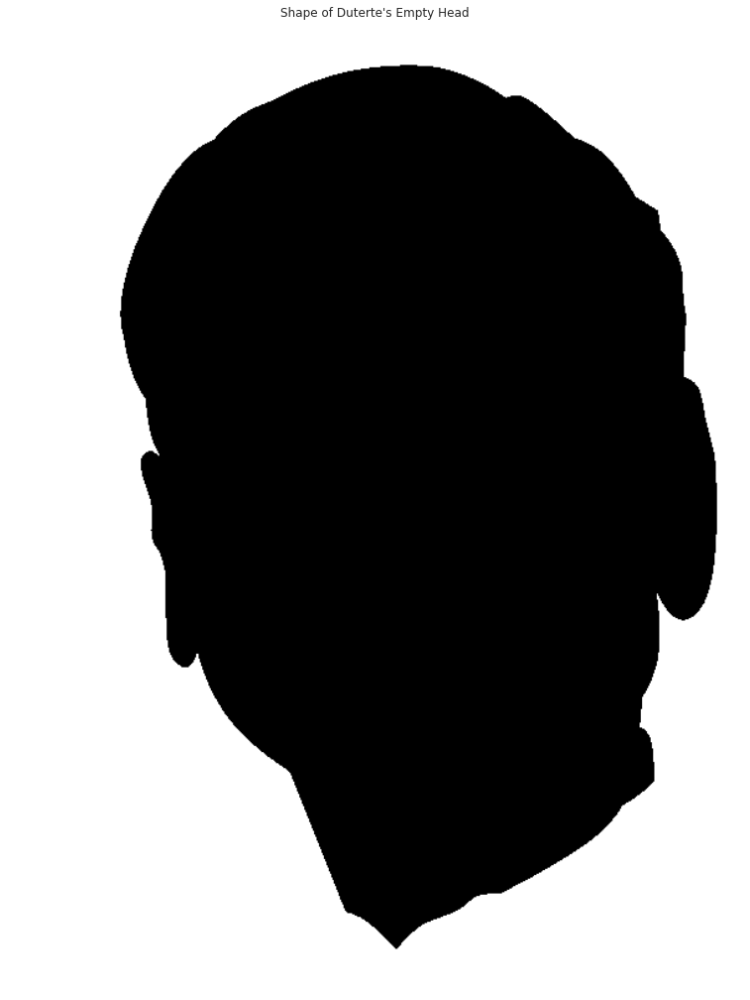

In [51]:
# Import duterte Logo
image = np.array(Image.open('duterte-pic3.png').convert('L')) # import the image here
    
fig = plt.figure() # Instantiate the figure object
fig.set_figwidth(14) # set width
fig.set_figheight(18) # set height

plt.imshow(image, cmap=plt.cm.gray, interpolation='bilinear') # Display data as an image
plt.axis('off') # Remove axis
plt.title("Shape of Duterte's Empty Head")
plt.show() # Display image

In [52]:
def blue_color_func(word, font_size, position, orientation, random_state=None,**kwargs):
    return "hsl(185, 35.4%%, %d%%)" % random.randint(40, 70)

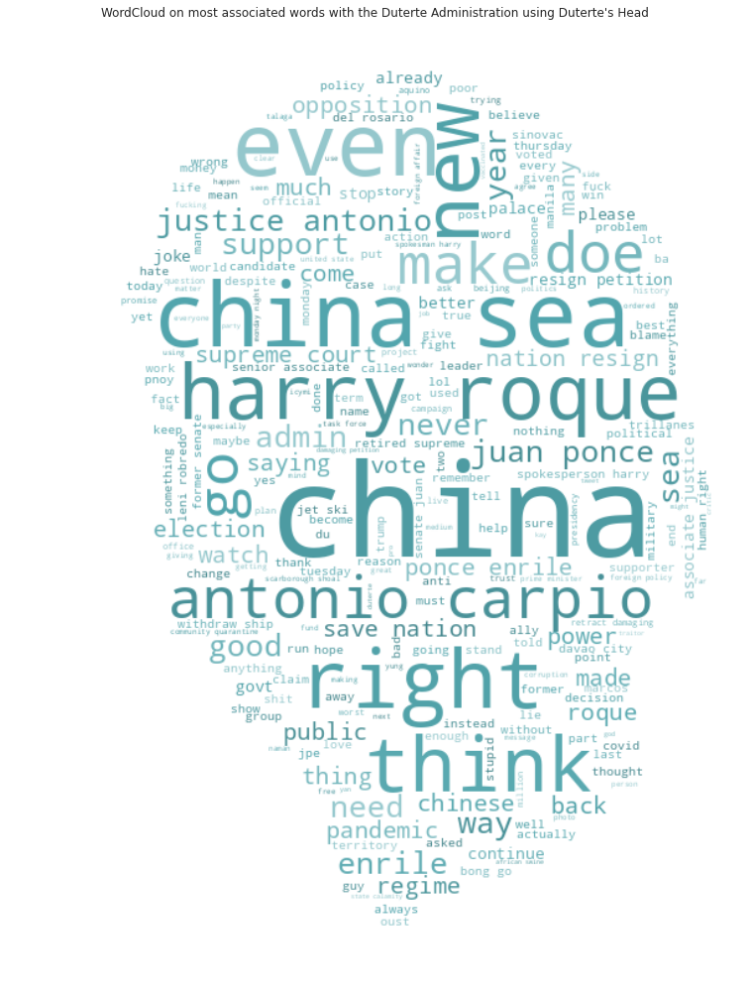

In [53]:
# Instantiate the Twitter word cloud object
twitter_wc = WordCloud(background_color='white', max_words=250, mask=image)

# generate the word cloud
twitter_wc.generate(tweets_long_string)

# display the word cloud
fig = plt.figure()
fig.set_figwidth(14)  # set width
fig.set_figheight(18)  # set height

plt.imshow(twitter_wc.recolor(color_func=blue_color_func, random_state=3), interpolation="bilinear")
plt.axis('off')
plt.title("WordCloud on most associated words with the Duterte Administration using Duterte's Head")
plt.show()

As seen from the word cloud, many of the top words, such as "china sea" and "china", are related to the recent issue regarding the West Philippine Sea and the relationship between China and the Philippines. Additionally, some are also the names of notable people in the politics, such as "Juan Ponce Enrile" and "Carpio".

In [54]:
twitter_wc.to_file("duterte_wordcloud.png") #save to a png file

Nonetheless, we show the top words in a list to have a more detailed presentation.

The succeeding cells are implemented to include the words in a list and count their occurences.

In [55]:
# Combine all words into a list
tweets_long_string = tweets_df['processed_text'].tolist()
tweets_list = []
for item in tweets_long_string:
    item = item.split()
    for i in item:
        tweets_list.append(i)

In [56]:
# Use the Built-in Python Collections module to determine Word frequency
from collections import Counter
counts = Counter(tweets_list)
top_words = pd.DataFrame.from_dict(counts, orient='index').reset_index()
top_words.columns = ['Words', 'Count']
top_words.sort_values(by='Count', ascending=False, inplace=True)

This shows the top 20 words that are commonly used in tweets.

In [57]:
top_words.head(20).style  # Check dataframe first 10 rows

,Words,Count
59,china,2169
109,sea,1296
2,roque,606
298,year,522
56,enrile,506
208,nation,482
47,public,455
1003,right,453
94,get,449
802,even,436


### Most common emojis in tweets

Similarly, the project will also be considering the emojis used in tweets that associate to president Duterte and the administration.

In [58]:
def noEmojis (emojiList):
    if len(emojiList) == 0:
        return True

In [59]:
# index_names = tweets_df[tweets_df['text'].apply(lambda tweet: "olivia" in tweet.lower())].index
# tweets_df.drop(index_names, inplace=True)
index_names = tweets_df[tweets_df['emoji'].apply(lambda emojiList: len(emojiList) == 0)].index
tweets_with_emoji = tweets_df.drop(index_names)
tweets_with_emoji = tweets_with_emoji['emoji']
for i, v in tweets_with_emoji.iteritems():
    tweets_with_emoji[i] = list(set(v))
tweets_with_emoji = tweets_with_emoji.explode(ignore_index=True)
emoji_frequency = tweets_with_emoji.value_counts()
emoji_frequency = emoji_frequency.head(20)
emoji_frequency

🇵🇭    130
😂     119
👊     103
🤣      83
😭      74
🙄      46
❤️     44
😀      40
🤡      35
😁      34
🤔      34
🤮      31
🙏      30
👉      29
📰      27
😅      25
😡      23
📷      23
🇨🇳     22
😊      21
Name: emoji, dtype: int64

In [60]:
emoji_frequency.index

Index(['🇵🇭', '😂', '👊', '🤣', '😭', '🙄', '❤️', '😀', '🤡', '😁', '🤔', '🤮', '🙏', '👉',
       '📰', '😅', '😡', '📷', '🇨🇳', '😊'],
      dtype='object')

The frequency of each emoji can be seen on the visualization below:

In [61]:
emoji_barchart = go.Figure([go.Bar(x=emoji_frequency.index, y=emoji_frequency.values, marker_color = "#5a948a")])
emoji_barchart.update_layout(title="Counts of Top Emojis Used to Associate with Duterte")
emoji_barchart.show()

The top emoji is the Philippine flag emoji, 🇵🇭, which is not surprising given the context of this project. It is also worth noting that the China flag emoji, 🇨🇳, is also within the top 20 emojis, albeit having less frequency.

In [62]:
tweets_df[tweets_df["text"].apply(lambda tweet : '🇵🇭' in tweet)][["text"]].head(5).style

,text
106,@PsychicPrinces1 I Met this 3 People Personally😊👊🇵🇭Had a Picture also with Kuya/ Our Davao Vice Mayor Sebastian Duterte 🇵🇭👊with President Rodrigo Roa Duterte 😊🇵🇭👊
180,"Thank you, PRESIDENT RODRIGO ROA DUTERTE!!! ❤️🇵🇭‼️ #DUTERTE #TapangAtMalasakit https://t.co/QRVhXXIlXC"
337,"'PRE, FILIPINO AKO.' 🇵🇭 Ateneo Blue Eagles' Angelo Kouame tweeted this on Tuesday after President Rodrigo Duterte signed his naturalization into law, moving closer to finally playing for Gilas Pilipinas. READ: https://t.co/Q8POmVA4tG https://t.co/XMmPyv2lAO"
350,@manilabulletin Bashers may say all they want ro no avail but heartaches! Acknowledge two known facts! JPE became Senate President; Rodrigo Roa DU30 became the 16th Phils President with a landslide win of 16M+++votes! (Dinaya pa yun ng LP-losers party)👊🇵🇭 #EatUrHeartsOut ika nga ba sa ingles☯️
370,JUST IN: President Rodrigo Duterte has already signed and approved the naturalization bid of Ateneo center and Gilas prospect Ange Kouame. 🇵🇭 🏀 https://t.co/Bq7ZnsGEYs


The 2nd emoji with the highest frequency is the "face with tears of joy" emoji. However, the meaning of emojis may differ depending on the context. For example, instead of denoting joy and actual happiness, it may be used to show that the Twitter user is making fun of something.

In [63]:
tweets_df[tweets_df["text"].apply(lambda tweet : '😂' in tweet)][["text"]].head(5).style

,text
8,Sen.Villanueva on Thurs.suggested the production of an infomercial featuring President Rodrigo Duterte and VP Leni Robredo to encourage the Filipinos to get COV-19 vaccines.😂😂 The problem actually is vaccine hesitancy in general and wokes.okay? CHOOSY. tara kape☕
1966,"@GagTaboo THE PRESIDENT OF THE PHILIPPINES, RODRIGO DUTERTE, IS VERY INUTILE AND INCOMPETENT. PASS IT ON!. 😂😂😂😂😂😂"
2744,@CarlosAMMags @marortoll She refused to disclose what happened to the monetary donations. Porke daw ba kasi babae siya hinihingan siya report about that tapos si Digong ayaw ilabas ang SALN 😂 She really thought that people would buy that 😓
2794,"@SyLicoNgaAko Digong was caught in between, Synopharm failed to delivered the desired efficacy😂😅 https://t.co/yV7JcXh3Gf"
2812,"@SenLeiladeLima Basta headless chicken sya at naging eggless pa. PERIOD. Duterte stop saving your balls, your balls quit on you. 😂👍"


Another emoji frequently used is, unsurprisingly, the "fisted hand sign" emoji, which is one of Duterte's notable symbols. As seen in the following blocks of code, this emoji is being used to show support for the president.

In [64]:
tweets_df[tweets_df["text"].apply(lambda tweet : '👊' in tweet)][["text"]].head(5).style

,text
106,@PsychicPrinces1 I Met this 3 People Personally😊👊🇵🇭Had a Picture also with Kuya/ Our Davao Vice Mayor Sebastian Duterte 🇵🇭👊with President Rodrigo Roa Duterte 😊🇵🇭👊
350,@manilabulletin Bashers may say all they want ro no avail but heartaches! Acknowledge two known facts! JPE became Senate President; Rodrigo Roa DU30 became the 16th Phils President with a landslide win of 16M+++votes! (Dinaya pa yun ng LP-losers party)👊🇵🇭 #EatUrHeartsOut ika nga ba sa ingles☯️
507,"Critics, you will always have. If I were you, I wouldn’t mind them”-Senator Juan Ponce Enrile to President Rodrigo Roa Duterte:👊🇵🇭"
516,"And I think that history will judge you very well."" - Senator Juan Ponce Enrile to President Rodrigo Roa Duterte 👊🇵🇭"
527,President Rodrigo Roa Duterte Addresses the Nation👊🇵🇭 https://t.co/COhe5Ph7jK


---

## What is the overall perception of twitter users to the Duterte Administration?

This research question aims to obtain how users from twitter deem or perceive the president and the president and the administration. In this case, perception will be identified through sentiment analysis. For this project, the Valance Aware Dictionary and sEntinment Reasoner (VADER) model. Sentinment analysis in VADER primary relies on a dictionary which maps the lexical features into emotion intensities, which in this case are called sentiment scores. The processes for this analysis are explained in the succeeding cells as they are performed.

In the following block, we import the VADER Sentiment Analysis library of cjhutto found in this link: https://github.com/cjhutto/vaderSentiment

In [65]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

In order to compute for the Sentiment of each text, we first need to get the valence scores which indicates both the sentiment polarity (positive/negative), and the sentiment intensity on a scale from -4 to +4 wherein -4 dictates the most extreme negative sentiment and +4 dictates the most extreme positive sentiment. 

Shown below, we get the valence score of each of the processed text and assign it to a new column called `vader_scores`. This is done by applying the lambda function of python to every processed text with the use of `polarity_scores(tweet)`.

In [66]:
tweets_df['vader_scores'] = tweets_df['processed_text'].apply(lambda tweet:sid.polarity_scores(tweet))
tweets_df['vader_scores']

0        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
1        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
2        {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...
3        {'neg': 0.227, 'neu': 0.622, 'pos': 0.151, 'co...
4        {'neg': 0.0, 'neu': 0.548, 'pos': 0.452, 'comp...
                               ...                        
25063    {'neg': 0.73, 'neu': 0.27, 'pos': 0.0, 'compou...
25064    {'neg': 0.0, 'neu': 0.761, 'pos': 0.239, 'comp...
25065    {'neg': 0.375, 'neu': 0.625, 'pos': 0.0, 'comp...
25066    {'neg': 0.186, 'neu': 0.607, 'pos': 0.207, 'co...
25067    {'neg': 0.0, 'neu': 0.569, 'pos': 0.431, 'comp...
Name: vader_scores, Length: 14088, dtype: object

With the valence scores in place, we now compute for the compound score which gives a standardized threshold for classifying sentences as either positive, neutral, or negative.

In [67]:
tweets_df['compound'] = tweets_df['vader_scores'].apply(lambda score_dict: score_dict['compound'])
tweets_df['compound']

0        0.0000
1        0.0000
2        0.0000
3       -0.1779
4        0.8360
          ...  
25063   -0.4019
25064    0.2960
25065   -0.0516
25066    0.1531
25067    0.8442
Name: compound, Length: 14088, dtype: float64

We next define a function `sentimentScore` that classifies whether a tweet is positive, negative, or neutral based on `c`, which is the value from the the compound column.

In [68]:
def sentimentScore(c):
    if c >=0.05:
        return 'positive'
    elif c <= -0.05:
        return 'negative' 
    else:
        return 'neutral'

We can apply this to the compound column and store the class in `comp_score`.

In [69]:
tweets_df['comp_score'] = tweets_df['compound'].apply(sentimentScore)
tweets_df[tweets_df['comp_score']=='negative'][['comp_score', 'compound', 'vader_scores', 'text', 'processed_text']].head(20)

,comp_score,compound,vader_scores,text,processed_text
3,negative,-0.1779,"{'neg': 0.227, 'neu': 0.622, 'pos': 0.151, 'co...",President Rodrigo Duterte’s allies in Congress...,ally congress set start tackling next thursday...
5,negative,-0.3818,"{'neg': 0.14, 'neu': 0.86, 'pos': 0.0, 'compou...",LOOK: President Rodrigo Duterte is set to atte...,set attend nikkei future asia conference advan...
6,negative,-0.3182,"{'neg': 0.141, 'neu': 0.859, 'pos': 0.0, 'comp...",Presidential spokesperson Harry Roque said Pre...,spokesperson harry roque issued directive seei...
8,negative,-0.0772,"{'neg': 0.185, 'neu': 0.683, 'pos': 0.133, 'co...",Sen.Villanueva on Thurs.suggested the producti...,sen.villanueva thurs.suggested production info...
9,negative,-0.2732,"{'neg': 0.239, 'neu': 0.619, 'pos': 0.142, 'co...",President Rodrigo Duterte wants to invite form...,invite former chief executive discussion sea d...
12,negative,-0.7269,"{'neg': 0.325, 'neu': 0.588, 'pos': 0.086, 'co...",President Rodrigo Duterte is expected to join ...,expected join fellow head state nikkei future ...
13,negative,-0.4767,"{'neg': 0.256, 'neu': 0.744, 'pos': 0.0, 'comp...",President Rodrigo Duterte ordered vaccine czar...,ordered czar sec carlito galvez jr. allocate p...
23,negative,-0.3400,"{'neg': 0.231, 'neu': 0.769, 'pos': 0.0, 'comp...",@benign0 @YesYesYo13 Let me correct you. RODRI...,correct behave le crooked politician tambayan ...
24,negative,-0.4767,"{'neg': 0.383, 'neu': 0.617, 'pos': 0.0, 'comp...",President Rodrigo Duterte has ordered governme...,ordered official administer sought-after pfize...
30,negative,-0.4767,"{'neg': 0.237, 'neu': 0.763, 'pos': 0.0, 'comp...",President Rodrigo Duterte has ordered the use ...,ordered use pfizer dos poor indigent populatio...


By applying the `value_counts()` function of a Series, we now get the number of positive, negative, and neutral sentiments.

In [70]:
tweets_df['comp_score'].value_counts()

positive    5808
negative    4649
neutral     3631
Name: comp_score, dtype: int64

In [71]:
# Create dataframe for Count of Sentiment Categories
sentiment_counts = tweets_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
sentiment_counts

,sentiment,Total_Tweets
0,positive,5808
1,negative,4649
2,neutral,3631


In [72]:
colors = ['lightslategray',] * 3
colors[0] = '#225ea8'
colors[1] = '#bd0026'
sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=sentiment_counts.Total_Tweets,  marker_color = colors)])
sentiments_barchart.update_layout(title="Sentiments on all tweets")
sentiments_barchart.show()

In the following cells, we show 20 samples for each sentiment classifications and their corresponding compound score to manually check if the tweets have indeed been classified accurately.

#### Positive Tweet Samples

Some tweets classified as `positive` are indeed positive.

In [73]:
tweets_df[tweets_df["comp_score"] == "positive"].sort_values(by=['compound'], ascending=False)[['compound', 'text']].style

,compound,text
14902,0.974100,"@djakasss NO TO DU30'S DDS ALLIES IN PH GOVERNANCE. 2022 ELECTION WILL BE OUR LAST CHANCE TO CHANGE FOR A NEW PRES WHO IS EFFIENTLY, COMPETENT, IDEALIST, EXCELLENT EDUCATIONAL ATTAINMENT, WD COMPASSIONATE TO THE CROSS-SECTORS OF PH COMMUNITIES. WHO HAVE STRONG FAITH TO GOD. VP LENI 4 PRES."
9153,0.971900,"@BloombergAsia @bpolitics @teddyboylocsin @BloombergTV I LOVE FM Locsin, you, are really good, and I love the Philippines, President Duterte, this Man, is fantastic, so, you keep him, one of the best FM, I have ever come accross, seriously, I mean it :-) This Man, is a a FANTASTIC FM, TAKE THAT BEIJING, GET THE F* OUT, OF MY WATER!"
4964,0.963300,"Why vote or support any of Duterte's friends and candidates who sit by and let China trample over our national pride and sovereignity. Friends respect our national boundaries. China is no friend, until she learns to respect ours boundaries and people"
18456,0.962300,"@rtoledosj @cherrysingh065 @the “Only the rich, the powerful, and the influential enjoy relative peace and security,” from the very own words of Juan Ponce Enrile. So he lives by this philosophy. No wonder he supported the dictator Marcos and now with Duterte."
9902,0.960100,We have a President who listens to his people. He really loved the Filipinos and his countrymen felt that love. President Rodrigo Roa #Duterte continues to win the trust and approval of the Filipino people. https://t.co/NbMhYlJpYY
687,0.959500,"Our beloved President 'Rodrigo Roa Duterte' Please help our country neighbor #palestine There’s alot of reason why we will try to help them, and the main reason why we need to help them is WE ARE ALL HUMAN, WHO WANT PEACEFUL AND FREE. 2nd is they are MUSLIMS"
9516,0.958400,"Pres Duterte hopes that the Eid'l Fit or end of Ramadan holiday will instill generosity, compassion, goodwill as well as lead to peace and unity @MalayaNews @Malaya_Online https://t.co/tIXsCij4gB"
6294,0.958400,"Happiest birth day🎉🎉 Mayor Inday Sara Duterte!!! Our loving Future President!! Stay strong and healthy,,God bless you more🙏❤ https://t.co/lVi9d47wPh"
15766,0.958400,"I hope Pres. Duterte's term ends. I hope he gracefully exit the Malacañang. Now, i don't care if he would be punished by law or not, but i hope he's healthy enough to see a how Philippines bounceback from this pandemic with the help of new responsible leaders."
24887,0.957100,"6/ When Trump develops an ally, they *must* offer him a benefit that's personal and profound. That was true with Putin. That was true with MBS. That was true with MBZ. That was true with Duterte. It was true with Bolsonaro. And paradoxically, it may have been true... with Maduro."


An example is the following tweet with a score of 0.95, which praises Duterte's leadership.

In [74]:
tweets_df[['compound', 'text']].loc[[978]].style

,compound,text
978,0.950100,"President Rodrigo Roa #Duterte @RRD_Davao has demonstrated a strong and decisive leadership and this is appreciated by most #Filipinos as evidenced by his high satisfaction, approval, trust and performance ratings. https://t.co/9YOD6rLTwr"


However, many were misclassified, which may be because of the sarcastic tone in the tweet. For example, the following tweet may be classified as negative as it contains insults such as "pea brained".

In [75]:
tweets_df[['compound', 'text']].loc[[25043]].style

,compound,text
25043,0.401900,@gmanews There are so many pea brained people commenting here that are actually just posting their comments without reading the full report. People! This condition is given by COVAX who donated the vaccine and clearly stated by Duterte in this news feed. Magbasa kayo para di mukantanga!!!


#### Neutral Tweet Samples

Following this, we check the tweets classified as `neutral`.

In [76]:
tweets_df[tweets_df["comp_score"]=="neutral"].sort_values(by=['compound'], ascending=False)[['compound', 'text']].style

,compound,text
21074,0.046400,@gmanews no tension because Duterte didnt do any resistance...a coward.
13154,0.043300,I think we all agree that Duterte doesnt have credibility/moral ascendancy over this. Lol. Even a child noticed and called him out on this. https://t.co/TBaEKlYEZZ https://t.co/SygNGwqjvV
7258,0.043300,Malacañang on Thursday assured the public that President Rodrigo Duterte will not surrender the Philippines’ sovereign rights over the #WestPhilippineSea despite its improving ties with #China. https://t.co/NFzUCZD5xM
7279,0.043300,Malacañang on Thursday assured the public that President Rodrigo Duterte will not surrender the Philippines’ sovereign rights over the West Philippine Sea (WPS) despite its improving ties with China. https://t.co/73Px6JiakF
9225,0.040800,"🇵🇭 | ""controversy over Chinese ships in the Philippine EEZ has led to criticism of #Duterte’s alleged softness toward #CCP🇨🇳, despite territorial disputes. He recently defended his stance, saying his government owed a “debt of gratitude” to Beijing for supplying COVID19 vaccines"" https://t.co/T3CaqwAnU6"
16025,0.039700,"@AndresMaharlika @gmanews I don't think that logic applies in this case. Being picky on what to put in your body is never wrong. Your body, your choice. Duterte telling people not to be choosy when he himself CHOSE his own *unapproved* vaccine is total hypocrisy."
23709,0.038200,"Duterte doesn't like the US but the US keeps coming to our aid in the WPS and now the vaccines. he should never have cursed the US and flirted scandalously with China and Russia. Besides, most Pinoys are more at home with the US. https://t.co/G5dWbfc7uS"
5971,0.037700,"#Duterte decides that all disputes should be resolved peacefully only once China is the opponent. He has never applied this same narrative to any ""war"" of his own making in the Philippines. He bombed an entire city into rubble and has murdered tens of thousands of civilians."
18944,0.034100,i voted for her because i didnt think duterte will fulfill any of his promises concerning peace negotiation https://t.co/3qcB1wFJTQ
4518,0.028900,"In 2017, I was doxxed by Mocha Uson. The photo where I was exposed was never a protest rally about Digong but the bitch made it appear on her FB that I was part of a conspiracy to turn against the government."


For tweets classified as neutral, it can be seen that some were misclassified below.

For example, for the following tweets classified as `neutral`, when read by actual people, may be classified as `negative` instead. This exposes one limitation of the project; Filipino words in the tweets were not taken into account, so words such as "palpak", while negative, may not be considered in calculating the polarity score.

In [77]:
tweets_df[['compound', 'text']].loc[[25014, 25017, 25018, 25028]].style

,compound,text
25014,0.000000,@IpeLustre Exactly. It is Duterte’s mess. Why can’t he not handle China. What is so beholden that you cannot tell them to leave and go to UN and ask for help from our other allies.
25017,0.000000,I think President Duterte should step down now from his office now. So we can go back to our normal lives now. #MentalHealthPH
25018,0.000000,@inquirerdotnet ngek no way! duterte will only ride on VP Leni’s credibility. #dutertePALPAK 👊🏼💩
25028,0.000000,#AskOlivia can you say duterte palpak


It is also important to note that positive tweets were also misclassified as `neutral`, as shown below:

In [78]:
tweets_df[tweets_df["comp_score"] == "neutral"].tail(20)[['compound', 'text']].loc[[25041]].style

,compound,text
25041,0.000000,Duterte legacy. 🇵🇭👊 #FreeCollegeEducation https://t.co/WOPl7ZP4HQ


#### Negative Tweet Samples

For the tweets classified as `negative`, the VADER library has mostly deduced the correct sentiment of the tweets with a negative sentiment. 

Words such as kill, as seen on the fifth tweet in this sample, is a negative word that deems the text to get a compound score of -0.97, therefore making it lean towards being classified as a negative tweet.

In [79]:
tweets_df[tweets_df["comp_score"] == "negative"].sort_values(by=['compound'])[['compound', 'text']].style

,compound,text
6323,-0.975800,"Uhm both sides are “red tagging” po, this admin calls some of you as terrorists due to suspicious actions and also some of you calls Duterte a killer, mass murderer, and a thief. Wag magmalinis"
14985,-0.974400,"we all have the rights to be angry, because of du30's incompetence and his shitty governance millions of filipinos lost their jobs, many are suffering because of poverty, students are stuck in their homes struggling because of online classes and their mental health is at risk ++"
19658,-0.974100,Ppl who r dumb will just eat & swallow Du30’s shit! But those who aren’t stupid will not use Sonza’s post as source of info. Using inquirer’s headline to mislead ppl is stupid. Not going to war doesn’t mean a leader has given up to fight. We won in UN & ur poon sided w/ enemy!😡 https://t.co/Vz5gML9gtb
9107,-0.973800,"Under Duterte, hundreds of peasant and Indigenous People’s leaders, unionists, activists and rights defenders have died - from brutal extrajudicial killings to gross neglect during their unjust detention amid the pandemic."
24542,-0.970500,"@cnnphilippines President Duterte, Covid if fake. It’s our flu bug renamed Covid. The flu kills over 2 million a year. This year no deaths. Renamed Covid-19. The vaccine is made by the World Population Control people. The vaccine will kill more."
15750,-0.969800,Familiar tactics. Fuck netanyahu. Fuck duterte. Fuck war criminals and fascists. https://t.co/fgW0xwVx2H
2760,-0.968600,"Digong is the scourge of the Filipino people from 2016 until2022. All this Regime has done is inflict division among Filipinos, make life miserable for the poor people, kill the youth & the innocent, protect his team of liars, killers, thieves, accusers & originator of fake news. https://t.co/4f4xOVWT6v"
19497,-0.968200,fuck → fuck → fuck allkpop du30 label v ↑ 😄👍🏻 ↓ fuck ← fuck ← fuck SM j4m magno mnet
8654,-0.967800,@inquirerdotnet Xi said it because he knows Duts is scared Xi exploited and continues to exploit what has now become known to all That Duts is scared A mind war between opposing leaders always precedes a ground war It was a battle that was lost long before it started Duts was poorly advised
5105,-0.967400,@ABSCBNNews its a national tragedy that the 16million filipino people elected duterte. they are the main cause of our national tragedy! they elected a president who has no balls against china! he is a bully to small even innocent people but coward to the real enemy(china)! so pathetic!


However, there are also minimal cases of false negatives, like the following tweet:

In [80]:
tweets_df[['compound', 'text']].loc[[6323]].style

,compound,text
6323,-0.975800,"Uhm both sides are “red tagging” po, this admin calls some of you as terrorists due to suspicious actions and also some of you calls Duterte a killer, mass murderer, and a thief. Wag magmalinis"


### Sentiment Analysis on Top 1% Tweets

For this part, we will perform sentiment analysis on the top 1% according to retweet and favorite counts.

To get the top tweets they are separated into two categories: Most Retweeted and Most Favorited. Only 1% of the total tweets is taken to get the tweets with significantly higher favorites or retweets.

In [81]:
N = math.ceil(tweets_df.shape[0] * .01)
mostRetweeted_df = tweets_df.sort_values(by="retweet_count", ascending=False).head(N)
mostFavorited_df = tweets_df.sort_values(by="favorite_count", ascending=False).head(N)
mostRetweeted_df[['comp_score', 'compound', 'text', 'favorite_count']].style

,comp_score,compound,text,favorite_count
11700,negative,-0.557400,"articles on the blatant sexism, homophobia, and murder committed by the philippine president, rodrigo duterte. ; a thread",3932
7389,positive,0.557400,"LOOK: Retired Senior Associate Justice Antonio Carpio responds to President Rodrigo Duterte's recent statement on the West Philippine Sea. Duterte asked Carpio and ex-DFA Secretary Albert Del Rosario: If you’re bright, why did we lose the West Philippine Sea? | @TristanNodalo https://t.co/ePhnLQv3Ot",4780
6946,negative,-0.897900,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime.",7884
7420,negative,-0.226300,"Apart from Covid-19, Philippines could face food crisis in the very near future because 240,000 KILOS of FISH are ILLEGALLY taken away DAILY by Chinese fishing vessels. Save the Nation! #DuterteResign #DuterteTraydor #DutertePalpak Sign the Petition! https://t.co/rv5raUJvfG https://t.co/hNdd726bTE https://t.co/PeZ3UrX7TJ",2962
11590,positive,0.599400,'JOKE-JOKE LANG' The fisherman who asked President Rodrigo Duterte during the 2016 presidential debates about his actions to help fishermen in the West Philippine Sea said the President has become a joke too. https://t.co/j5UV6cAJk4 https://t.co/4uro3jJQr2,4585
1421,positive,0.897900,"CHALLENGE ACCEPTED. Retired Supreme Court Senior Associate Justice Antonio Carpio refuses to back down and ""gladly accepts"" President Rodrigo Duterte's dare to a debate on the West Philippine Sea issue. https://t.co/xfXy53xEdL",8561
20050,negative,-0.051600,So you're just going to let the Chinese Vessels invading the west Philippine Sea just because we have a huge debt to China? Open your eyes Du30! Hindi teritoryo ang dapat na ibayad sa utang! #DuterteTraydor #DutertePalpak #DuterteInutil,3535
11893,positive,0.374400,Context: Davao City is where current president Rodrigo Duterte got his political start; on his “achievement” list as mayor is allowing sex tourism/trafficking of children rise substantially under his watch. This shelter is a huge W and there should be more like it! https://t.co/wedq7vsp96,4866
1305,positive,0.865800,"Challenge made. Challenge accepted. And now, we have a host. The Philippine Bar Association now volunteers to host the debate between President Rodrigo Duterte and Retired Supreme Court Justice Antonio Carpio about the West Philippine Sea. @ABSCBNNews https://t.co/fwBj8MwTGi",6190
13035,positive,0.421500,It’s May. Duterte’s final year as president. Nice.,12151


In [82]:
mostFavorited_df[['comp_score', 'compound', 'text', 'favorite_count']].style

,comp_score,compound,text,favorite_count
13035,positive,0.421500,It’s May. Duterte’s final year as president. Nice.,12151
1421,positive,0.897900,"CHALLENGE ACCEPTED. Retired Supreme Court Senior Associate Justice Antonio Carpio refuses to back down and ""gladly accepts"" President Rodrigo Duterte's dare to a debate on the West Philippine Sea issue. https://t.co/xfXy53xEdL",8561
6946,negative,-0.897900,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime.",7884
1305,positive,0.865800,"Challenge made. Challenge accepted. And now, we have a host. The Philippine Bar Association now volunteers to host the debate between President Rodrigo Duterte and Retired Supreme Court Justice Antonio Carpio about the West Philippine Sea. @ABSCBNNews https://t.co/fwBj8MwTGi",6190
1339,neutral,0.000000,JUST IN: The Philippine Bar Association offers to host debate between President Rodrigo Duterte and ret. SC SAJ Antonio Carpio on the West Philippine Sea. | via @mikenavallo https://t.co/eIvexyPlHO,5493
11893,positive,0.374400,Context: Davao City is where current president Rodrigo Duterte got his political start; on his “achievement” list as mayor is allowing sex tourism/trafficking of children rise substantially under his watch. This shelter is a huge W and there should be more like it! https://t.co/wedq7vsp96,4866
7389,positive,0.557400,"LOOK: Retired Senior Associate Justice Antonio Carpio responds to President Rodrigo Duterte's recent statement on the West Philippine Sea. Duterte asked Carpio and ex-DFA Secretary Albert Del Rosario: If you’re bright, why did we lose the West Philippine Sea? | @TristanNodalo https://t.co/ePhnLQv3Ot",4780
11936,positive,0.128000,"'PANAHON NG KAMPANYA 'YAN' President Rodrigo Duterte admitted that his promise in 2016 to ride a jet ski to Spratly Islands and plant a Philippine flag there is a “pure campaign joke,” adding that those who believed him are “stupid.” https://t.co/FJhXBSzqBJ https://t.co/66wDT1tlsE",4722
11590,positive,0.599400,'JOKE-JOKE LANG' The fisherman who asked President Rodrigo Duterte during the 2016 presidential debates about his actions to help fishermen in the West Philippine Sea said the President has become a joke too. https://t.co/j5UV6cAJk4 https://t.co/4uro3jJQr2,4585
8284,positive,0.440400,"We lost the crown, but we still love you Rabiya. Kasalanan ito ni Duterte. We need to oust him to reclaim our universe.",4583


Since the scores of each tweet has already been previously calculated, the remaining steps are to count the positive, negative and neutral tweets and compare them to each other.

In [83]:
top_Rt_sentiment_counts = mostRetweeted_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
top_Rt_sentiment_counts
top_Rt_sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=top_Rt_sentiment_counts.Total_Tweets,  marker_color = colors)])
top_Rt_sentiments_barchart.update_layout(title="Sentiments on Top 1% Retweeted Tweets")
top_Rt_sentiments_barchart.show()

In [84]:
top_Fv_sentiment_counts = mostFavorited_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
top_Fv_sentiment_counts
top_Fv_sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=top_Fv_sentiment_counts.Total_Tweets,  marker_color = colors)])
top_Fv_sentiments_barchart.update_layout(title="Sentiments on Top 1% Favorited Tweets")
top_Fv_sentiments_barchart.show()

The most retweeted and most favorited tweets show the same ranking as before, with higher positive tweets and least neutral tweets. However, it is worth noting, again, that some tweets have been misclassified. One example is the following tweet, which has been classified as `positive` but is observably negative:

In [85]:
mostFavorited_df.loc[[5002]][['comp_score', 'text']].style

,comp_score,text
5002,positive,"This is ABSOLUTELY horifying. Babies, barely any weeks old in PGH, are out on the streets clumped together in the middle of a PANDEMIC cause the government would rather pour state funds on the shores of Manila bay rather than to the health care system!!! TANGINA OUST DUTERTE NOW https://t.co/U9QlFt1oLY"


---

## How are twitter users reacting to the government response to the COVID situation in the Philippines?

To limit the tweets that are related to the COVID pandemic, we need to filter out tweets with COVID-related keywords, such as COVID, pandemic, vaccine, lockdown, quarantine, ECQ, MECQ, etc.

In [86]:
covid_keywords = ['covid19', 'covid', 'symptomatic',
                'coronavirus', 'community quarantine', 'quarantine',
                'ppe', 'social distancing', 'self-isolation',
                'self-quarantine', 'super spreader', 'outbreak',
                'epidemic', 'pandemic', 'mask',
                'herd immunity', 'contact tracing', 'contactless',
                'essential', 'lockdown', 'face-to-face',
                'ftf', 'pui', 'symptomatic', 'vaccine',
                'sinovac', 'pfizer', 'moderna', 'sputnik', 'covax']

In [87]:
covid_df = tweets_df[tweets_df["processed_text"].apply(lambda text: any(keyword in text for keyword in covid_keywords))]

In [88]:
covid_df[["processed_text"]].head().style

,processed_text
0,spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility
1,spokesperson harry roque jr. indigent soon prioritized pfizer following order line condition set covax facility
2,participate nikkei future asia conference expected discus way achieve full recovery amid pandemic
5,set attend nikkei future asia conference advance view position ongoing global fight pandemic achieve full recovery world
6,spokesperson harry roque issued directive seeing lack physical distancing area developed american firm pfizer administered


Since we have already performed sentiment analysis on the whole dataset, we already have the scores and classifications on our COVID dataset. By applying the `value_counts()` function of a Series, we now get the number of positive, negative, and neutral sentiments.

In [89]:
covid_sentiment_counts = covid_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
covid_sentiment_counts

,sentiment,Total_Tweets
0,positive,554
1,negative,538
2,neutral,387


In [90]:
covid_sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=covid_sentiment_counts.Total_Tweets,  marker_color = colors)])
covid_sentiments_barchart.update_layout(title="Sentiments on Tweets Regarding the Covid-19 Situation")
covid_sentiments_barchart.show()

#### Positive Tweet Samples

The tweets classified as positive may be viewed by filtering and then sorting the DataFrame.

In [91]:
covid_df[covid_df["comp_score"]=="positive"].sort_values(by=['compound'], ascending=False)[['compound', 'text']].style

,compound,text
15766,0.958400,"I hope Pres. Duterte's term ends. I hope he gracefully exit the Malacañang. Now, i don't care if he would be punished by law or not, but i hope he's healthy enough to see a how Philippines bounceback from this pandemic with the help of new responsible leaders."
4534,0.924600,"@ABSCBNNews Of course he is a hero to you. Duque did not immediately purchase the vaccine so we are contented with Sinovac, no choice. Now you Digong is successful with your plan because people took Sinovac all because of Duque. That's why you are calling him a hero."
19467,0.924600,"Frankly, @DrTonyLeachon , of what use is this kind of good news useful to Filipinos when the Du30 govt seems to be making little effort to get these vacs but pushing the mantra - the best vac is the one in your arm - and that will likely be Sinovac which Du30 is flooding in. 😎 https://t.co/O8kIRVUtha"
4557,0.924600,I have a dream 😴 I wish it will come true. GOD Stopped the killings of the youths & the innocents 😇. I prayed to GOD to Save our Country from Digong & his cohorts & for Digong to set us free. I prayed once more for GOD to give us back our WPS & EEZ & for China to stay away.Amen
8821,0.918600,"@PeterVilladolid @inquirerdotnet Very happy to help. ""Masa"" appeal is what got Erap, PNoy, and Duts the presidency, and Mar Roxas the #1 slot in the senate. Hoping the opposition gets it right this time and finally wins in 2022."
5179,0.916900,@MashaMasha2022 @annacollins52 So why can’t you guys ask help from your loving Poon? See what happens. Loyal DDS most of you di ba? I don’t think Duterte cares. Bwaaaah!
16009,0.901700,"Good news from Ambassador Harpas. Israel (now the 1st nation on earth to successfully achieve herd immunity via vaccinating almost all their adults) has qualified the PH as a priority in sharing its excess vaccines, particularly due to the friendship between Netanyahu and Duterte https://t.co/Pv192adgNQ"
10184,0.897900,"I read from a scientist and an article published by epidemiologist saying that Sinovac is effective in real world. This gives me less hesitation but yes, people should have a freedom of choice I agree it’s not the best we have and I fckin hate Du30 for (+) https://t.co/PvDcGHMoTe"
19446,0.897900,"@inquirerdotnet you can't make everyone to pleased you JPE for what happened before,but despite of all the acquisition pres.du30 still choose you to be his legal advisor. He trust and believes you. looking forward for this best tandem du30 and JPE 💪"
19948,0.895700,"@alvinelchico TFC UK. DOES A GOOD FRIEND CONQUER A FRIEND’S PROPERTY AND BULLY A FRIEND? IN WHAT WAY IS THE PHILS. INDEBTED TO CHINA, ASIDE FROM THE COVID-19 VIRUS? THE SINOVAC VACCINES, R DONATION UNLESS DU30 BEG 4 THEM. HELLO! DEMENTIA COMING INTO VIEW! THANK YOU."


While the results show that a majority of the tweets are positive, it can be seen from above that some tweets were misclassified upon manual inspection. Many tweets that were classified as `positive` are actually quite negative. Some examples can be seen below.

In [92]:
covid_df[covid_df["comp_score"]=="positive"].tail(10)[['compound', 'text']].style

,compound,text
24667,0.077200,ITS SUCH A HAPPY TRACK IHATE HOW I CAN STREAM THIS ON THE BUS STUPID PANDEMIC RESPONSE KASALANAN MO TO DUTERTE
24760,0.202300,"@FactUpo @SAPBongGo What a sorry excuse for a Senator. The work will always speak for itself. Rather than photobomb Duterte’s public appearances & go around the country campaigning early in the guise of “helping”, he should put in the effort to learn. The “hard work” is c/o his staff. And it shows."
24764,0.440400,"@marcushjohnson It appears once a century, right wing populist strong man fascists take root - there has been a long enough time for people to think ""it can never happen again."" Problem is - yes it can... Look at Duterte, Bolsinaro, Trump, Orban. Putin is just sitting back laughing..."
24785,0.226300,@piaranada @rapplerdotcom Duterte giving a speech about COVID recovery is the most ironic news I’ve read today. Or are the Japanese showing him as an example of “how not to handle COVID”? Must be it. https://t.co/2yOr4O1RqS
24831,0.102700,@mariaressa Use vaccination sites in barangays for Pfizer? Sure if they are airconditioned. Duterte must have forgotten the temperature requirement for the Pfizer vaccines.
24852,0.202300,Duterte does not even know what COVAX rules are for administering vaccines to the people. Nakialam na naman yung walang alam. As usual Motormouth Roque had to support his boss. COVAX donated vaccine are for the most vulnerable sectors. Galvez seems to know more.
24884,0.510600,The opposition can't disabuse themselves of the notion that Duterte is a Chinese puppet. This reminds me of the columns that Kit Tatad wrote during the first year of the administration. Most were a disconnect between Tatad's intellectual capabilities https://t.co/U5wAG5MkWc
24935,0.381800,@MaamSyj Please don’t equate getting sinovac with being a duterte supporter. This sends the wrong message on vaccination. Let’s change this mindset and encourage everyone to get vaccinated instead. Otherwise we will be stuck in this rut for a very long time.
25043,0.401900,@gmanews There are so many pea brained people commenting here that are actually just posting their comments without reading the full report. People! This condition is given by COVAX who donated the vaccine and clearly stated by Duterte in this news feed. Magbasa kayo para di mukantanga!!!
25064,0.296000,$PSEI - Duterte to join Nikkei’s Future of Asia confab on post-pandemic recovery https://t.co/EU6a3RevPk https://t.co/4ud10BPXmp #PSETODAY #PSEI #Philippines


In [93]:
covid_df[['compound', 'text']].loc[[24760, 24785, 24831]].style

,compound,text
24760,0.202300,"@FactUpo @SAPBongGo What a sorry excuse for a Senator. The work will always speak for itself. Rather than photobomb Duterte’s public appearances & go around the country campaigning early in the guise of “helping”, he should put in the effort to learn. The “hard work” is c/o his staff. And it shows."
24785,0.226300,@piaranada @rapplerdotcom Duterte giving a speech about COVID recovery is the most ironic news I’ve read today. Or are the Japanese showing him as an example of “how not to handle COVID”? Must be it. https://t.co/2yOr4O1RqS
24831,0.102700,@mariaressa Use vaccination sites in barangays for Pfizer? Sure if they are airconditioned. Duterte must have forgotten the temperature requirement for the Pfizer vaccines.


#### Neutral Tweet Samples

As expected, some tweets classified as neutral are news-related tweets.

In [94]:
covid_df[covid_df["comp_score"] == "neutral"].sort_values(by=['compound'], ascending=False)[['compound', 'text']].style

,compound,text
9225,0.040800,"🇵🇭 | ""controversy over Chinese ships in the Philippine EEZ has led to criticism of #Duterte’s alleged softness toward #CCP🇨🇳, despite territorial disputes. He recently defended his stance, saying his government owed a “debt of gratitude” to Beijing for supplying COVID19 vaccines"" https://t.co/T3CaqwAnU6"
4518,0.028900,"In 2017, I was doxxed by Mocha Uson. The photo where I was exposed was never a protest rally about Digong but the bitch made it appear on her FB that I was part of a conspiracy to turn against the government."
18723,0.025800,"“Believe the government and the people you elected in the government like me…if not, you will lengthen (the time before we reach) the herd immunity,” President Duterte said. https://t.co/fjThkeIyxQ"
14472,0.025800,"@TrillanesSonny Enrile eas there for a sarswela, to kiss du30's ass. What do u expect from an old trapo like enrile. The fact remain that Pnoy n allied pursue the case and won. The problem now is the Chinese lap dog du30 for being a puppet of China. #DuterteDuwag."
7505,0.025800,"President Rodrigo Duterte has retained the modified enhanced community quarantine (MECQ) classification of the National Capital Region, Bulacan, Cavite, Laguna, and Rizal until May 14. | via @pr1ncegolez https://t.co/LcYjzYuJfJ"
24823,0.025800,"While millions of Filipinos grow hungry, lose jobs, and are denied aid amid the pandemic, Duterte’s cronies grow exorbitantly wealthier. Services, utilities, and natural resources are now more privatized than ever. https://t.co/pfD8Ko1sRY"
6493,0.025800,Robredo earlier backed the call of a group of doctors from the Philippine General Hospital for a further review of China-based Sinovac BioTech’s COVID-19 vaccine CoronaVac. Read: https://t.co/KdXXLzXBIJ https://t.co/nXap0mbf5g
2750,0.025800,"@gmanews If only digong acted as diligent good father of the family, inferior sinovac is unacceptable having other better choices. Kickvac lang ang dahilan pinagpilitan eto para sa commission."
7494,0.025800,"President Rodrigo Roa Duterte addresses the Filipino people on several matters concerning the nation, including new community quarantine classifications in the country and updates on the government’s Coronavirus Disease 2019 (COVID-19) responses, in his weekly Talk to the Pe…"
11953,0.000000,Happening now: regular Talk to the People of President Rodrigo Duterte @AbanteNews


#### Negative Tweet Samples

Lastly, upon manual inspection, tweets classified as negative mostly contain a true negative sentiment.

In [95]:
covid_df[covid_df["comp_score"]=="negative"].sort_values(by=['compound'], ascending=True)[['compound', 'text']].style

,compound,text
9107,-0.973800,"Under Duterte, hundreds of peasant and Indigenous People’s leaders, unionists, activists and rights defenders have died - from brutal extrajudicial killings to gross neglect during their unjust detention amid the pandemic."
24542,-0.970500,"@cnnphilippines President Duterte, Covid if fake. It’s our flu bug renamed Covid. The flu kills over 2 million a year. This year no deaths. Renamed Covid-19. The vaccine is made by the World Population Control people. The vaccine will kill more."
5998,-0.964800,"The 6 years of the Duterte ainistration will be marked by a failed drug war, a failed corruption drive, gross neligence, lies and more lies and a bad economy and mishandled pandemic. Correct me if I missed somethings but space is limited guys."
6092,-0.956500,"""Failure (TO DEFEAT DUTERTE In 2022) will delay recovery from the pandemic, see more victims of Duterte’s brutal drug war, and a continued corrosion of the country’s remaining democratic institutions."" https://t.co/sJ2hkmXnKv"
9137,-0.953800,"@Kul0t_ @defixiones666 @levy_wong @Punongbayan_ The room for change should have happened when a wife was embracing her dead husband on the street of manila after being killed by the police. After that, there is no room for that. And notice how he only blamed PNP and not the one who made this killings possible. Duterte."
4618,-0.952400,"Wicked men, however, do not think about them or make any effort to know their situations. In the midst of the pandemic, the Duterte administration proves itself to be wicked, weaponizing the current crises and countless attacks against the progressives and the poor."
23612,-0.944200,"@booksnaaklat @ToniSpeakEasy Kung sa covid lang, abot tanaw na ang pagasa. There will be more deaths still but this will not kill all of us. What will kill us is if we will allow another Duterte or another Marcos to run the country. We will be infamously called ""Masochists of Asia"" by then"
5144,-0.932500,"@thereisanocean @dReyDreymz0810 @gwapong_pinoy Except not only has the worst economic recession happened during Duterte's term, the Philippines under Duterte also has the worst economic contraction in Asia. So you can't use the pandemic as an excuse for Duterte's incompetence."
18525,-0.930000,"""The raging pandemic is an eye-opener to the catastrophic hubris of Duterte. The population is starving, people are dying, and Filipinos are desperate. Every Filipino bears the brunt from the consequences of our poor choice of leadership."" https://t.co/k7WTEjDC1N"
14860,-0.930000,"This is what scares me: That somehow even while Du30’s unraveling and losing traction with the pandemic, the opposition does something stupid to somehow kill their momentum. Stop shooting yourselves in the foot, please. https://t.co/CatIU5GAlz"


However, some tweets can be classified as leaning towards neutral as they are news-related tweets.

In [96]:
covid_df[covid_df["comp_score"]=="negative"].tail(10)[['compound', 'text']].iloc[[1]].style

,compound,text
24856,-0.743000,"President Duterte made the decision to avert any possible rice shortage in the next months and avoid difficulty in importing rice from neighboring Southeast Asian countries, which tightened their exports last year due to the coronavirus pandemic. https://t.co/pgoi7UwQ9L"


### Sentiment Analysis on Top 10% Tweets Related to COVID

We will also get the sentiment analysis on the most retweeted and most favorited tweets related to COVID. We will calculate N as 10% of the total tweets instead of 1, since the covid dataset is much smaller than the original dataset.

Here's the resulting dataset for the top retweeted tweets about COVID.

In [97]:
covid_N = math.ceil(covid_df.shape[0] * .10)
covid_mostRetweeted_df = covid_df.sort_values(by="retweet_count", ascending=False).head(covid_N)
covid_mostRetweeted_df[['comp_score', 'compound', 'retweet_count', 'text']].style

,comp_score,compound,retweet_count,text
6946,negative,-0.897900,1936,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime."
5002,positive,0.493900,408,"This is ABSOLUTELY horifying. Babies, barely any weeks old in PGH, are out on the streets clumped together in the middle of a PANDEMIC cause the government would rather pour state funds on the shores of Manila bay rather than to the health care system!!! TANGINA OUST DUTERTE NOW https://t.co/U9QlFt1oLY"
7015,neutral,0.000000,291,"BREAKING: Watch as Philippine President Rodrigo Duterte gets inoculated with China-made Sinopharm coronavirus vaccine, which does not have an EUA in the Philippines. 🎥 Senator Bong Go https://t.co/S5RURczrLZ"
11809,neutral,0.000000,180,Philippine President Rodrigo Duterte says he will not compromise the nation’s South China Sea claims over coronavirus vaccines from China https://t.co/cIey7Fbq7f
11821,neutral,0.000000,167,"BREAKING: President Rodrigo Duterte has placed the country under a state of calamity for one year due to the African Swine Fever outbreak pursuant to Proclamation No. 1143 which he signed on May 10, says spokesman Harry Roque says | @pplmanuel https://t.co/qfvQFXyJVF"
24823,neutral,0.025800,138,"While millions of Filipinos grow hungry, lose jobs, and are denied aid amid the pandemic, Duterte’s cronies grow exorbitantly wealthier. Services, utilities, and natural resources are now more privatized than ever. https://t.co/pfD8Ko1sRY"
7497,neutral,0.000000,115,"President Rodrigo Duterte has extended the modified enhanced community quarantine in Metro Manila and adjacent provinces of Bulacan, Rizal, Cavite, and Laguna or the National Capital Region Plus until May 14, 2021. READ: https://t.co/DXJqWdz3rZ https://t.co/zViXvxt17t"
7504,positive,0.421500,113,Heads up! Here are the new quarantine classifications for May 2021 as approved by President Rodrigo Duterte. Visit https://t.co/EDjVS4HOwc for stories and more. https://t.co/SKGan3z6tL
7509,neutral,0.000000,109,"BREAKING: President Rodrigo Duterte has extended the modified enhanced community quarantine in Metro Manila and adjacent provinces of Bulacan, Rizal, Cavite, and Laguna or the National Capital Region Plus until May 14, 2021. https://t.co/7lK5hvubxz"
15643,positive,0.381800,95,"Dear Duterte government, you want Filipinos to return abroad to work asap. Do you realize many host countries will be requiring proof of vaccination & Sinopharm & Sinovac wont be one of the jabs they will recognize? 😎 #duterteinutil #DutertePalpak #NTFPalpak #DoHPalpak"


Here's the resulting dataset for the top favorited tweets about COVID.

In [98]:
covid_mostFavorited_df = covid_df.sort_values(by="favorite_count", ascending=False).head(covid_N)
covid_mostFavorited_df[['comp_score', 'compound', 'favorite_count', 'text']].style

,comp_score,compound,favorite_count,text
6946,negative,-0.897900,7884,"Rodrigo Duterte has failed, betrayed, & terrorized our country with his pandemic response, cowardice in the West Philippine Sea, and culture of impunity. To call him a good president, let alone one of the best, is to ignore the suffering of the Filipino people under his regime."
7015,neutral,0.000000,1464,"BREAKING: Watch as Philippine President Rodrigo Duterte gets inoculated with China-made Sinopharm coronavirus vaccine, which does not have an EUA in the Philippines. 🎥 Senator Bong Go https://t.co/S5RURczrLZ"
5002,positive,0.493900,706,"This is ABSOLUTELY horifying. Babies, barely any weeks old in PGH, are out on the streets clumped together in the middle of a PANDEMIC cause the government would rather pour state funds on the shores of Manila bay rather than to the health care system!!! TANGINA OUST DUTERTE NOW https://t.co/U9QlFt1oLY"
5944,positive,0.510600,453,Vice President Leni Robredo expressed that she's willing to appear in a vaccine infomercial alongside President Duterte which aims to encourage the public to get vaccinated against #COVID19. READ: https://t.co/BGAcqBbSar https://t.co/htE3nKbVCx
15643,positive,0.381800,429,"Dear Duterte government, you want Filipinos to return abroad to work asap. Do you realize many host countries will be requiring proof of vaccination & Sinopharm & Sinovac wont be one of the jabs they will recognize? 😎 #duterteinutil #DutertePalpak #NTFPalpak #DoHPalpak"
15743,negative,-0.202300,374,"Roque: Admin bets will win in 2022 because of its well managed pandemic response Tell that to 25M non-DDS voters, to the families of thousands of COVID victims and to the families of thousands who lost their jobs because of Duterte’s incompetence."
11821,neutral,0.000000,364,"BREAKING: President Rodrigo Duterte has placed the country under a state of calamity for one year due to the African Swine Fever outbreak pursuant to Proclamation No. 1143 which he signed on May 10, says spokesman Harry Roque says | @pplmanuel https://t.co/qfvQFXyJVF"
16009,positive,0.901700,355,"Good news from Ambassador Harpas. Israel (now the 1st nation on earth to successfully achieve herd immunity via vaccinating almost all their adults) has qualified the PH as a priority in sharing its excess vaccines, particularly due to the friendship between Netanyahu and Duterte https://t.co/Pv192adgNQ"
15985,positive,0.726900,318,"No one among Duterte's predecessors has dared and cared enough for the Filipinos to make education free and accessible for all. For years, inclusive education was a mere myth until it has happened recently. https://t.co/Pd8JAKbE7e"
24823,neutral,0.025800,311,"While millions of Filipinos grow hungry, lose jobs, and are denied aid amid the pandemic, Duterte’s cronies grow exorbitantly wealthier. Services, utilities, and natural resources are now more privatized than ever. https://t.co/pfD8Ko1sRY"


We plotted the frequencies using a bar graph, similar to what was previously done.

In [99]:
covid_top_Rt_sentiment_counts = covid_mostRetweeted_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
covid_top_Rt_sentiment_counts
covid_top_Rt_sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=covid_top_Rt_sentiment_counts.Total_Tweets,  marker_color = colors)])
covid_top_Rt_sentiments_barchart.update_layout(title="Sentiments on Top Retweeted Tweets for Covid-19")
covid_top_Rt_sentiments_barchart.show()

In [100]:
covid_top_Fv_sentiment_counts = covid_mostFavorited_df['comp_score'].value_counts().rename_axis('sentiment').to_frame('Total_Tweets').reset_index()
covid_top_Fv_sentiment_counts
covid_top_Fv_sentiments_barchart = go.Figure([go.Bar(x=['positive', 'negative', 'neutral'], y=covid_top_Fv_sentiment_counts.Total_Tweets,  marker_color = colors)])
covid_top_Fv_sentiments_barchart.update_layout(title="Sentiments on Top Favorited Tweets for Covid-19")
covid_top_Fv_sentiments_barchart.show()

As we can see, for both the top retweeted and favorited tweets, a majority of tweets are still positive, followed by negative, and lastly, neutral. This follows the same order as the frequency of positive, negative, and neutral tweets for the larger dataset.

---

## Conclusions

This notebook seeks to answer some questions about people's perception about the Duterte Administration. This was done through the collection of data from twitter posts. The following questions have been answered accordingly through the analysis of the data collected:

1. **What are the words commonly associated with the Duterte Administration?**
    - The word most commonly associated with Duterte is China, and this makes sense in accordance with the recent news about Duterte's relations with China.
    - Some names were also found to be commonly associated with Duterte such as Leni Robredo, Del Rosario, Aquino, Carpio, Juan Ponce Enrile, Roque, Trillianes, Marcos, Sara Duterte, and Bong Go. These seem to be the names of politicians and officials who have close relations with Duterte or have been reported in recent news alongside his name.
    - Positive and negative words have also been seen such as "support" for positive, and "opposition" or "oust" for negative.

2. **What is the overall perception of twitter users to the Duterte Administration?**
    - Based on the sentiment analysis tool used, the overall perception of twitter users about the Duterte Administration is more skewed towards the positive side.
    - There are also more tweets classified as `negative` regarding Duterte than `neutral`, however, these are still lower than the positive tweets.
    - The ranking of the sentiment classes stay the same (`positive`, `negative`, `neutral`) even after filtering the less retweeted and less favorited tweets.
    - There are false positives found in the sentiments of the tweets but these are only minimal and are limited to the capabilites of the model used. Also, the model is unable to analyze words in Filipino, thus reducing the context of some tweets.

3. **How are twitter users reacting to the government response to the COVID situation in the Philippines?**
    - Similar to the overall perception, the tweets that were limited to the COVID situation in the Philippines is more skewed towards the positive side. 
    - Also, there are more tweets classified as `negative` regarding Duterte than `neutral`; however, again, these are less than the tweets classified as `positive`.
    - The ranking of the sentiment classes stay the same (`positive`, `negative`, `neutral`) even after filtering the less retweeted and favorited tweets.

Overall, there is no unified sentiment regarding the Duterte Administration. There are many positive tweets, but there are also negative and neutral sentiments that should also be considered.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=deff6236-e166-4cd3-83a0-06f65663f394' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>